# Conformal Prediction for Computer Vision

### Loading Libraries

In [1]:
# Numerical Computing
import math
import numpy as np

# Data Manipulation
import pandas as pd

# Data Visualization
import matplotlib.pyplot as plt
from matplotlib.image import imread

# Java Script Notation Object
import json

### Data Preparation: Loading Data

In [9]:
# Load cached data
if not os.path.exists('../data'):
    os.system('gdown 1h7S6N_Rx7gdfO3ZunzErZy6H7620EbZK -O ../data.tar.gz')
    os.system('tar -xf ../data.tar.gz -C ../')
    os.system('rm ../data.tar.gz')
if not os.path.exists('../data/imagenet/human_readable_labels.json'):
    !wget -nv -O ../data/imagenet/human_readable_labels.json -L https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json

data = np.load('../data/imagenet/imagenet-resnet152.npz')
example_paths = os.listdir('../data/imagenet/examples')
smx = data['smx']
labels = data['labels'].astype(int)

Downloading...
From (original): https://drive.google.com/uc?id=1h7S6N_Rx7gdfO3ZunzErZy6H7620EbZK
From (redirected): https://drive.google.com/uc?id=1h7S6N_Rx7gdfO3ZunzErZy6H7620EbZK&confirm=t&uuid=34a79222-da58-4220-9526-a794a4380e81
To: /datasets/data.tar.gz
100%|██████████| 1.31G/1.31G [00:17<00:00, 72.9MB/s]


### Setting Parameters for Conformal Prediction

- Problem setup

In [11]:
# Calibration Points
n_cal = 1000 

# 1-alpha as Desired Coverage
alpha = 0.1 

### Splitting Data

In [13]:
type(smx)

numpy.ndarray

In [15]:
smx.shape

(50000, 1000)

In [17]:
# Split Softmax Scores into Calibration & Validation Sets (Saving The Shuffling)
idx = np.array([1] * n_cal + [0] * (smx.shape[0]-n_cal)) > 0
idx

array([ True,  True,  True, ..., False, False, False])

In [19]:
np.random.seed(42)
np.random.shuffle(idx)

cal_smx, test_smx = smx[idx,:], smx[~idx,:]
cal_labels, test_labels = labels[idx], labels[~idx]

### Understanding Data Storaging

In [21]:
test_labels.shape

(49000,)

In [23]:
cal_labels.shape

(1000,)

- Zooming on Calibration Set Labels

The first 10 labels in the calibration set are  [0 0 1 3 5 6 6 6 7 9]
The minimal label is  0
The maximal label is  999


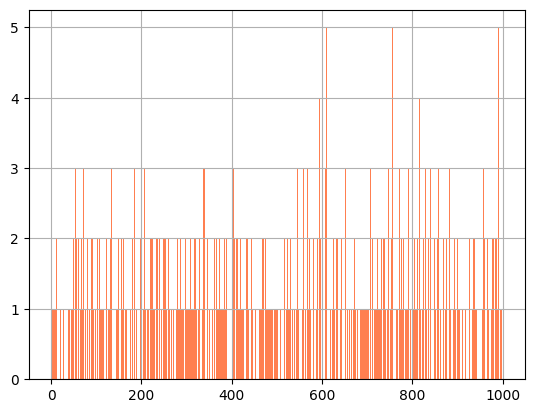

In [32]:
print("The first 10 labels in the calibration set are ", cal_labels[:10])
print("The minimal label is ",np.min(cal_labels))
print("The maximal label is ",np.max(cal_labels))
plt.hist(cal_labels,bins=1000, color='coral');

plt.grid(True)

- Zooming Test Set Labels

The first 10 labels in the test set are  [0 0 0 0 0 0 0 0 0 0]
The minimal label is  0
The maximal label is  999


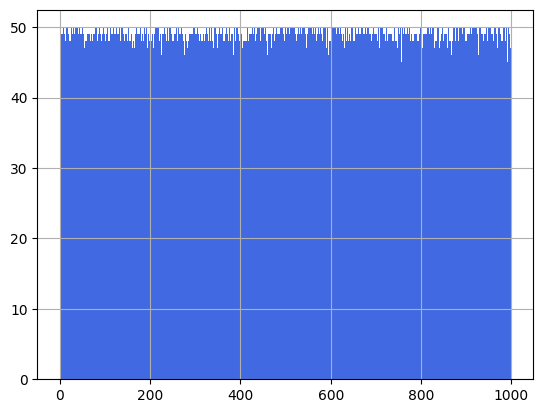

In [36]:

print("The first 10 labels in the test set are ", test_labels[:10])
print("The minimal label is ",np.min(test_labels))
print("The maximal label is ",np.max(test_labels))
plt.hist(test_labels,bins=1000, color='royalblue');

plt.grid(True)

In [38]:
print("The total number of different labels in the dataset:",len(np.unique(labels)))

The total number of different labels in the dataset: 1000


The sum of a row of cal_smx gives  0.9999999642681061


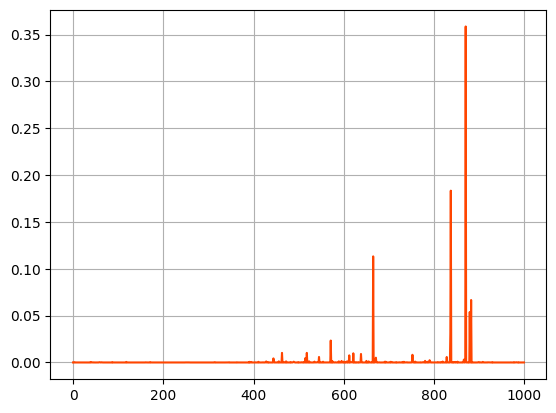

In [45]:
plt.plot(cal_smx[450], color='orangered')
print("The sum of a row of cal_smx gives ",np.sum(cal_smx[450]))

plt.grid(True)

## A 1st Way for Conformal Prediction

- Getting Non-Conformity Score using Hinge Loss

In [47]:
cal_scores = 1-cal_smx[np.arange(n_cal),cal_labels]

In [49]:
cal_scores[:20]

array([6.41689777e-01, 3.40580940e-04, 6.41055703e-02, 9.99865802e-01,
       5.47298789e-02, 2.35717893e-02, 6.09320402e-03, 3.33090365e-01,
       6.46929324e-01, 1.33633614e-04, 1.03235245e-04, 9.24706459e-04,
       7.72356987e-04, 1.80238485e-03, 6.89352751e-02, 9.39071178e-04,
       2.25394964e-03, 2.85923481e-04, 9.09763575e-03, 1.79862976e-03])

- Getting Adjusted Quantile on Non-Conformity Scores

In [51]:
q_level = np.ceil((n_cal+1)*(1-alpha))/n_cal

qhat = np.quantile(cal_scores, q_level, method='higher')

In [55]:
test_smx

array([[5.55347383e-01, 1.32564350e-03, 5.25403069e-04, ...,
        1.47947849e-05, 3.24599205e-05, 1.63325603e-06],
       [9.64658678e-01, 1.35036071e-05, 2.15132957e-07, ...,
        8.14401858e-07, 1.33911101e-07, 6.87838053e-09],
       [9.99836087e-01, 1.79859434e-08, 4.87714402e-09, ...,
        1.26598288e-05, 4.91699197e-08, 1.86872757e-11],
       ...,
       [1.57358859e-09, 4.43931967e-08, 7.34767447e-09, ...,
        8.11502957e-07, 1.32755105e-07, 8.50005984e-01],
       [9.93386379e-07, 1.08330059e-04, 1.62448850e-05, ...,
        3.21692278e-05, 3.94053168e-05, 1.20624267e-01],
       [5.22422567e-08, 3.57574663e-07, 4.72474085e-07, ...,
        1.06125162e-06, 5.35718618e-06, 1.40896440e-01]])

- Prediction Sets

In [57]:
prediction_sets = test_smx >= (1-qhat)

In [59]:
prediction_sets.shape

(49000, 1000)

In [61]:
prediction_sets

array([[ True, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False,  True],
       [False, False, False, ..., False, False,  True],
       [False, False, False, ..., False, False,  True]])

- Computing The Empirical Coverage

In [63]:
empirical_coverage = prediction_sets[np.arange(prediction_sets.shape[0]),test_labels].mean()
print(f"The empirical coverage is: {empirical_coverage}")

The empirical coverage is: 0.894469387755102


- Illustrating Prediction Sets for some points of Test Set

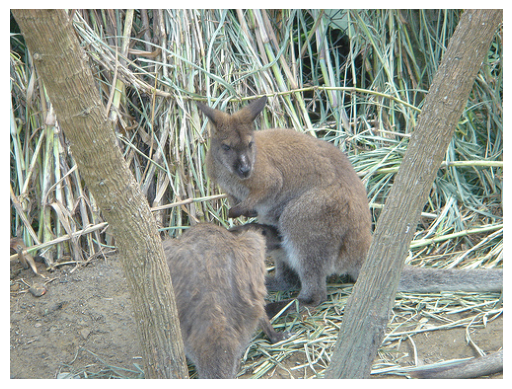

The prediction set is: ['wallaby']


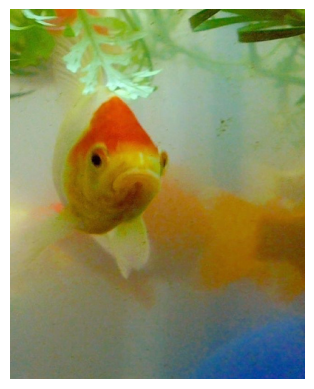

The prediction set is: ['goldfish']


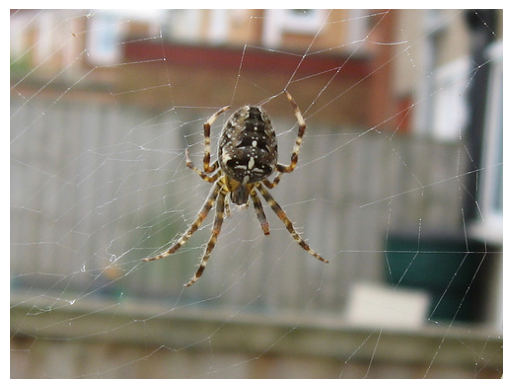

The prediction set is: ['European garden spider', 'spider web']


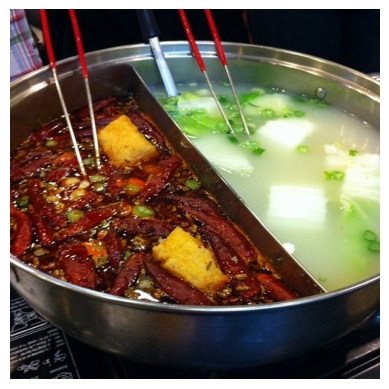

The prediction set is: ['cauldron', 'hot pot']


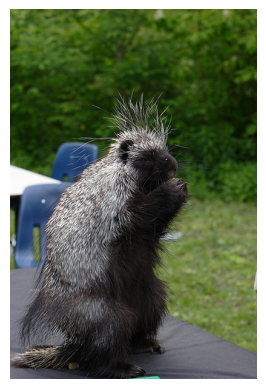

The prediction set is: ['porcupine']


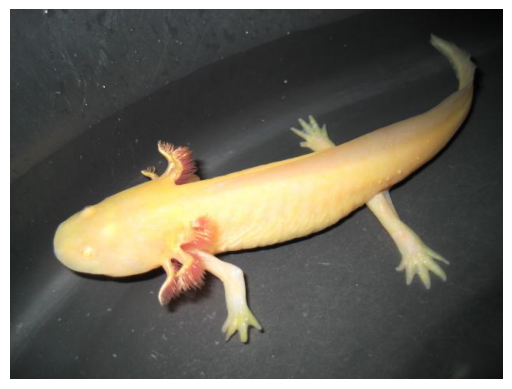

The prediction set is: ['axolotl']


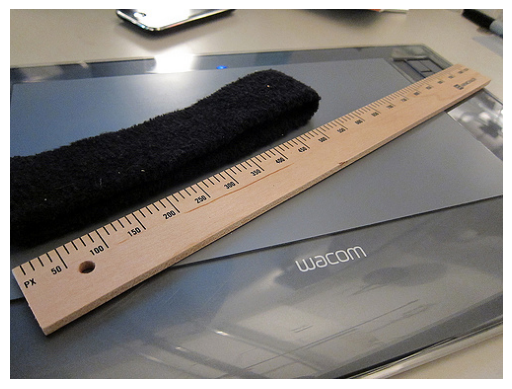

The prediction set is: ['ruler']


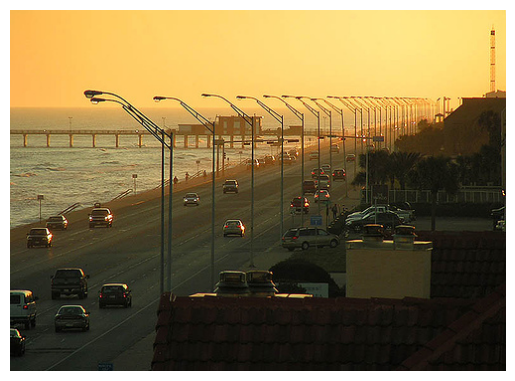

The prediction set is: ['baluster', 'greenhouse', 'shopping cart']


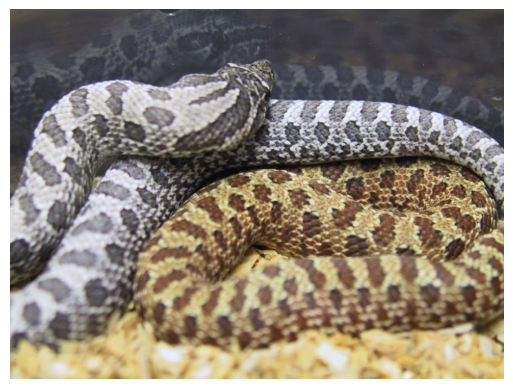

The prediction set is: ['eastern hog-nosed snake']


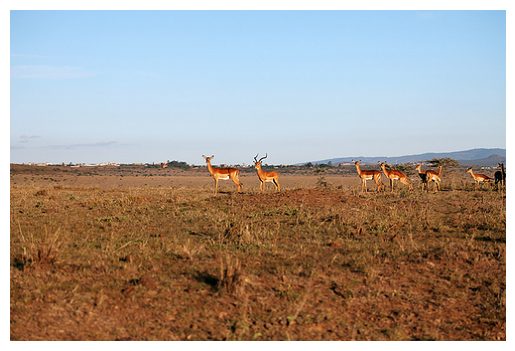

The prediction set is: ['impala', 'gazelle']


In [65]:
# Making the labels human-readable
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

# Show some examples
example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    #
    prediction_set = smx[img_index] > 1-qhat #TODO OPERAND
    #
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

## Adaptive Prediction Sets (APS)

In [67]:
cal_smx.shape

(1000, 1000)

In [69]:
# Getting scores -> calib_X.shape[0] == calib_Y.shape[0] == n
cal_pi = cal_smx.argsort(1)[:, ::-1]
cal_srt = np.take_along_axis(cal_smx, cal_pi, axis=1).cumsum(axis=1)
cal_scores = np.take_along_axis(cal_srt, cal_pi.argsort(axis=1), axis=1)[
    range(n_cal), cal_labels
]
# Getting The Score Quantile
qhat = np.quantile(
    cal_scores, np.ceil((n_cal + 1) * (1 - alpha)) / n_cal, method="higher"
)

test_pi = test_smx.argsort(1)[:, ::-1]
test_srt = np.take_along_axis(test_smx, test_pi, axis=1).cumsum(axis=1)
prediction_sets = np.take_along_axis(test_srt <= qhat, test_pi.argsort(axis=1), axis=1)

- Calculating Empirical Coverage

In [71]:
empirical_coverage = prediction_sets[
    np.arange(prediction_sets.shape[0]), test_labels
].mean()

print(f"The empirical coverage is: {empirical_coverage}")

The empirical coverage is: 0.8972857142857142


- Getting Examples

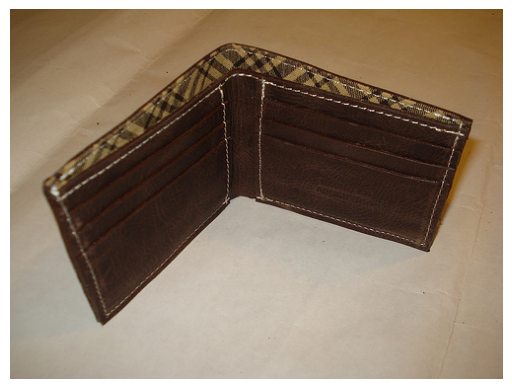

The prediction set is: ['wallet']


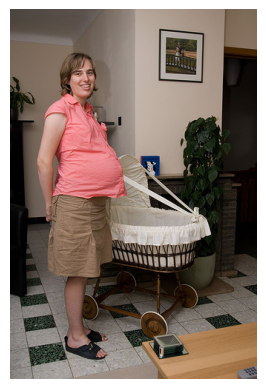

The prediction set is: ['bassinet', 'cradle']


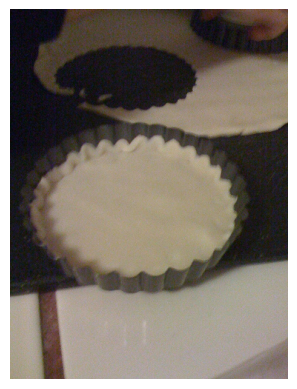

The prediction set is: ['great white shark', 'hammerhead shark', 'stingray', 'hen', 'junco', 'magpie', 'chickadee', 'bald eagle', 'vulture', 'newt', 'loggerhead sea turtle', 'leatherback sea turtle', 'mud turtle', 'terrapin', 'banded gecko', 'green iguana', 'frilled-necked lizard', 'Gila monster', 'European green lizard', 'chameleon', 'Nile crocodile', 'American alligator', 'triceratops', 'ring-necked snake', 'eastern hog-nosed snake', 'kingsnake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'African rock python', 'Indian cobra', 'sea snake', 'Saharan horned viper', 'eastern diamondback rattlesnake', 'sidewinder', 'trilobite', 'scorpion', 'southern black widow', 'tarantula', 'tick', 'centipede', 'black grouse', 'prairie grouse', 'peacock', 'grey parrot', 'macaw', 'lorikeet', 'hornbill', 'toucan', 'duck', 'goose', 'black swan', 'jellyfish', 'sea anemone', 'flatworm', 'nematode', 'conch', 'slug', 'sea slug', 'chiton', 'chambered nautilus', 'Dungeness cr

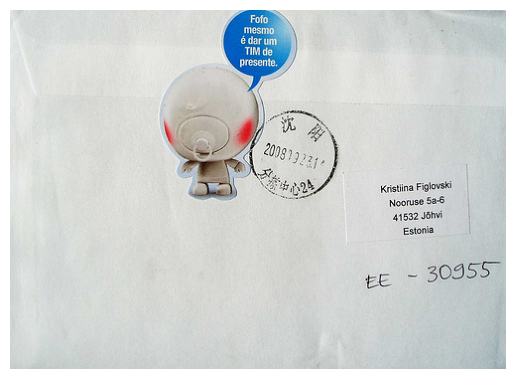

The prediction set is: ['tick', 'abacus', 'analog clock', 'apron', 'balloon', 'ballpoint pen', 'barometer', 'bathtub', 'bib', 'ring binder', 'poke bonnet', 'bottle cap', 'carton', 'chain', 'combination lock', 'infant bed', 'diaper', 'digital watch', 'dishwasher', 'electric fan', 'envelope', 'fountain pen', 'barrette', 'handkerchief', 'hook', 'iPod', 'T-shirt', 'knot', 'lab coat', 'lens cap', 'paper knife', 'loupe', 'magnetic compass', 'mail bag', 'measuring cup', 'necklace', 'nipple', 'packet', 'padlock', 'paper towel', 'pencil case', 'pencil sharpener', 'Petri dish', 'plectrum', 'piggy bank', 'pill bottle', 'pillow', 'plastic bag', 'plate rack', 'purse', 'quill', 'racket', 'radio', 'refrigerator', 'eraser', 'ruler', 'safe', 'safety pin', 'weighing scale', 'screw', 'shower curtain', 'slide rule', 'stethoscope', 'stopwatch', 'strainer', 'switch', 'syringe', 'teddy bear', 'thimble', 'tray', 'wall clock', 'wallet', 'water bottle', 'whistle', 'website', 'crossword', 'dust jacket', 'menu', 

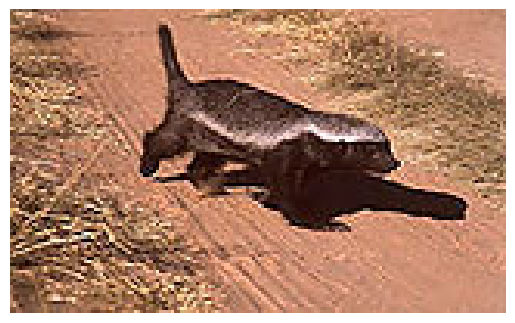

The prediction set is: ['tench', 'great white shark', 'tiger shark', 'hammerhead shark', 'electric ray', 'cock', 'hen', 'ostrich', 'brambling', 'magpie', 'American dipper', 'kite', 'vulture', 'great grey owl', 'fire salamander', 'smooth newt', 'newt', 'spotted salamander', 'axolotl', 'American bullfrog', 'tree frog', 'tailed frog', 'loggerhead sea turtle', 'leatherback sea turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'green iguana', 'desert grassland whiptail lizard', 'agama', 'frilled-necked lizard', 'alligator lizard', 'Gila monster', 'chameleon', 'Komodo dragon', 'Nile crocodile', 'American alligator', 'triceratops', 'worm snake', 'ring-necked snake', 'eastern hog-nosed snake', 'garter snake', 'vine snake', 'night snake', 'boa constrictor', 'African rock python', 'Indian cobra', 'green mamba', 'sea snake', 'Saharan horned viper', 'eastern diamondback rattlesnake', 'sidewinder', 'trilobite', 'harvestman', 'scorpion', 'yellow garden spider', 'barn spider', 'tarantu

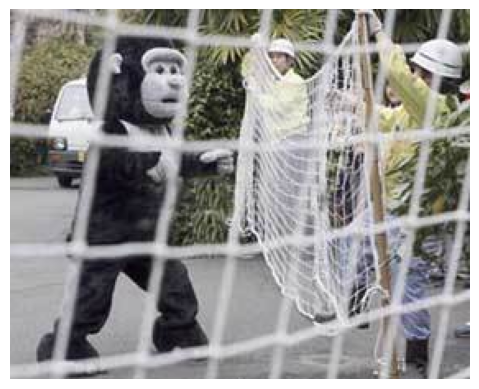

The prediction set is: ['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead shark', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'American robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'American dipper', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'fire salamander', 'smooth newt', 'axolotl', 'tree frog', 'loggerhead sea turtle', 'leatherback sea turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'green iguana', 'Carolina anole', 'desert grassland whiptail lizard', 'agama', 'frilled-necked lizard', 'alligator lizard', 'Gila monster', 'European green lizard', 'chameleon', 'Komodo dragon', 'Nile crocodile', 'American alligator', 'triceratops', 'worm snake', 'garter snake', 'night snake', 'African rock python', 'Indian cobra', 'green mamba', 'sea snake', 'eastern diamondback rattlesnake', 'harvestman', 'scorpion', 'yellow garden spider', 'barn spider', 'European garden spider', 'southern black widow', 

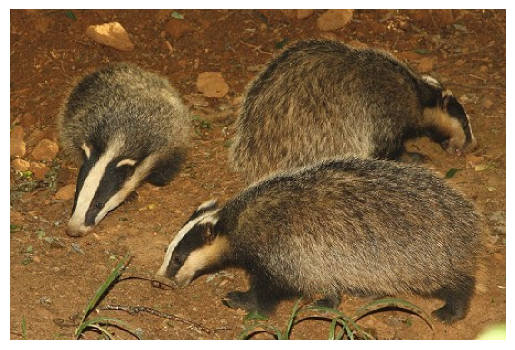

The prediction set is: ['echidna', 'wombat', 'grey fox', 'mongoose', 'meerkat', 'cottontail rabbit', 'hare', 'porcupine', 'fox squirrel', 'guinea pig', 'wild boar', 'weasel', 'European polecat', 'skunk', 'badger', 'three-toed sloth']


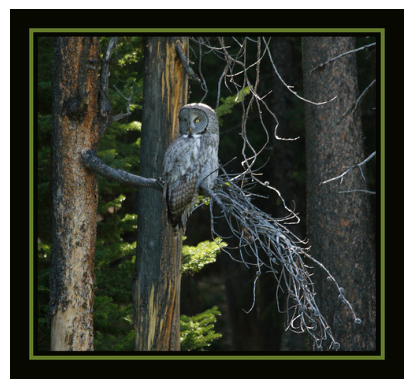

The prediction set is: ['house finch', 'American robin', 'jay', 'American dipper', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'ruffed grouse', 'quail', 'grey parrot', 'macaw', 'sulphur-crested cockatoo', 'hornbill', 'hummingbird', 'great egret', 'fox squirrel', 'three-toed sloth', 'guenon', 'langur', 'marmoset', 'titi', 'ring-tailed lemur', 'indri', 'split-rail fence']


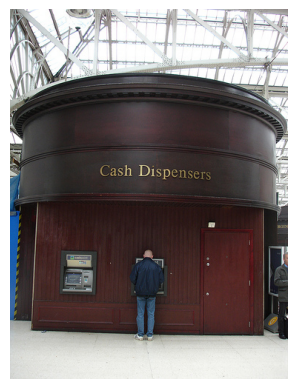

The prediction set is: ['electric ray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'American robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'American dipper', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'smooth newt', 'newt', 'spotted salamander', 'axolotl', 'tree frog', 'leatherback sea turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'green iguana', 'Carolina anole', 'desert grassland whiptail lizard', 'agama', 'frilled-necked lizard', 'alligator lizard', 'Gila monster', 'European green lizard', 'chameleon', 'Nile crocodile', 'American alligator', 'triceratops', 'worm snake', 'eastern hog-nosed snake', 'kingsnake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'African rock python', 'Indian cobra', 'green mamba', 'sea snake', 'Saharan horned viper', 'eastern diamondback rattlesnake', 'sidewinder', 'scorpion', 'yellow garden spider', 'barn spider', 'European garden spider', 'tar

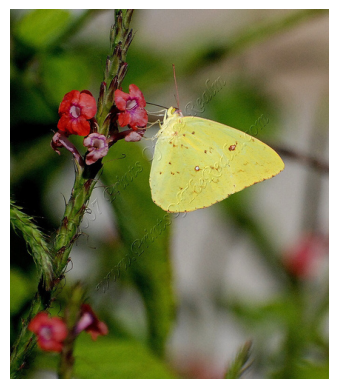

The prediction set is: ['small white', 'sulphur butterfly']


In [73]:
with open("../data/imagenet/human_readable_labels.json") as f:
    label_strings = np.array(json.load(f))

example_paths = os.listdir("../data/imagenet/examples")
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread("../data/imagenet/examples/" + rand_path)
    img_index = int(rand_path.split(".")[0])
    img_pi = smx[img_index].argsort()[::-1]
    img_srt = np.take_along_axis(smx[img_index], img_pi, axis=0).cumsum()
    prediction_set = np.take_along_axis(img_srt <= qhat, img_pi.argsort(), axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis("off")
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

## RAPS

- Setting RAPS Regularization Parameters 

In [75]:
lam_reg = 0.01
k_reg = 5

disallow_zero_sets = False
rand = True 
reg_vec = np.array(k_reg*[0,] + (smx.shape[1]-k_reg)*[lam_reg,])[None,:] 

In [77]:
# Get scores -> calib_X.shape[0] == calib_Y.shape[0] == n

cal_pi = cal_smx.argsort(1)[:,::-1];
cal_srt = np.take_along_axis(cal_smx,cal_pi,axis=1)
cal_srt_reg = cal_srt + reg_vec
cal_L = np.where(cal_pi == cal_labels[:,None])[1]
cal_scores = cal_srt_reg.cumsum(axis=1)[np.arange(n_cal),cal_L] - np.random.rand(n_cal)*cal_srt_reg[np.arange(n_cal),cal_L]

# Getting The Quantile Score 
qhat = np.quantile(cal_scores, np.ceil((n_cal+1)*(1-alpha))/n_cal, method='higher')

# Deployment
n_test = test_smx.shape[0]
test_pi = test_smx.argsort(1)[:,::-1]
test_srt = np.take_along_axis(test_smx,test_pi,axis=1)
test_srt_reg = test_srt + reg_vec
test_srt_reg_cumsum = test_srt_reg.cumsum(axis=1)
indicators = (test_srt_reg.cumsum(axis=1) - np.random.rand(n_test,1)*test_srt_reg) <= qhat if rand else test_srt_reg.cumsum(axis=1) -test_srt_reg <= qhat
if disallow_zero_sets: indicators[:,0] = True
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1)

- Calculate Empirical Coverage

In [79]:
empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean()

print(f"The empirical coverage is: {empirical_coverage}")
print(f"The quantile is: {qhat}")

The empirical coverage is: 0.8960408163265307
The quantile is: 0.9460060951042203


- Getting Examples

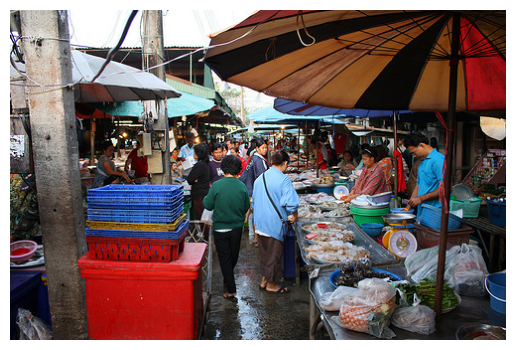

The prediction set is: ['butcher shop', 'grocery store']


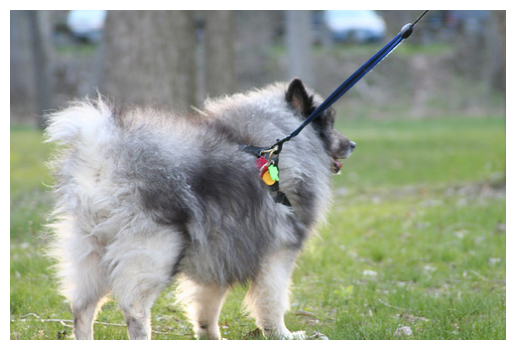

The prediction set is: []


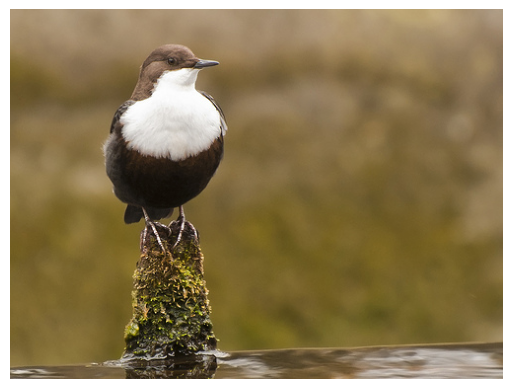

The prediction set is: ['American dipper']


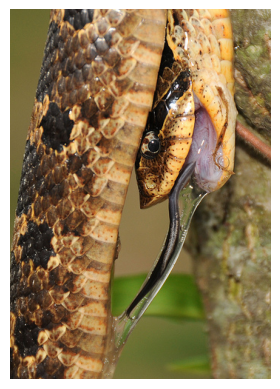

The prediction set is: ['eastern hog-nosed snake']


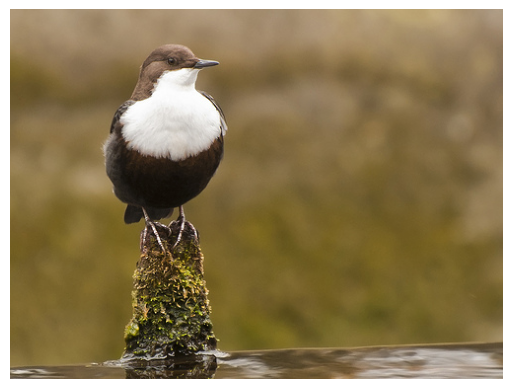

The prediction set is: ['American dipper']


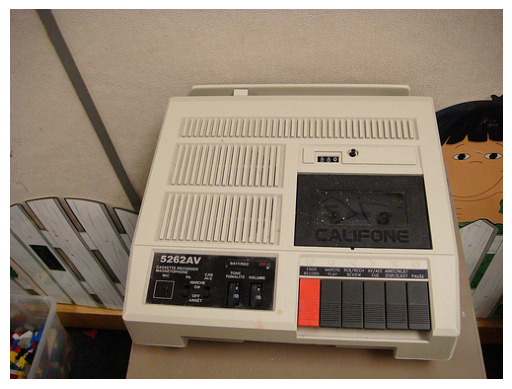

The prediction set is: ['cassette player', 'radio', 'tape player']


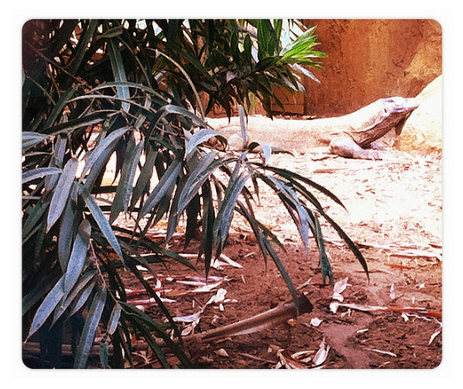

The prediction set is: ['green iguana', 'frilled-necked lizard', 'Gila monster', 'Komodo dragon', 'triceratops', 'echidna', 'wombat']


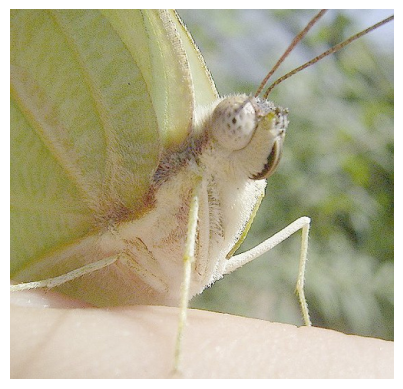

The prediction set is: ['mantis', 'small white', 'sulphur butterfly']


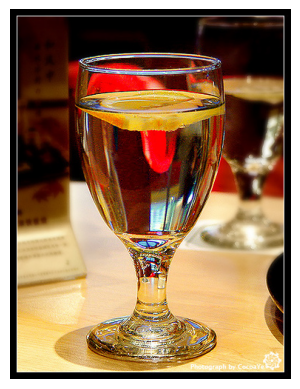

The prediction set is: ['beer glass', 'goblet', 'red wine']


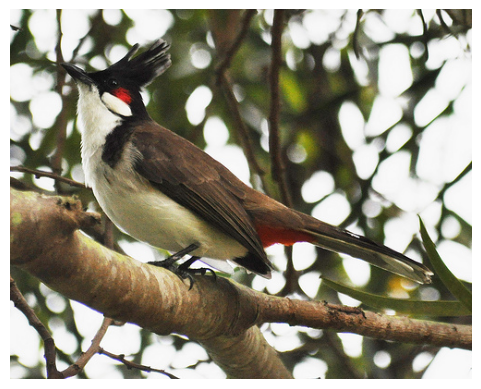

The prediction set is: ['bulbul']


In [81]:
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set
    _smx = smx[img_index]
    _pi = np.argsort(_smx)[::-1]
    _srt = np.take_along_axis(_smx,_pi,axis=0)
    _srt_reg = _srt + reg_vec.squeeze()
    _srt_reg_cumsum = _srt_reg.cumsum()
    _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat
    if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=fc2e34d5-cb6c-4e1d-b1a4-c3f9611c4cdf' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>